<a href="https://colab.research.google.com/github/cafechungkhoan/lyd-report/blob/main/VPB_27092021_Comment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **LYD - Comment Sentiment Analysis**

*LYD là hệ thống áp dụng Deep Learning dùng để quét, tóm tắt, phân tích và dự báo cảm xúc của nhà đầu tư. Với mục đích hỗ trợ nghiệp vụ tư vấn IR (Investor Relation)*

**Dữ liệu input**: 
là dữ liệu bình luận (text) của nhà đầu tư trên mạng xã hội và các diễn đàn chứng khoán lớn. Quy mô tracking 700k user

**Các Model áp dụng**: 
Bert, transformer, SVM, PhoBERT 

### **LYD trả lời các câu hỏi chính**:
* **Mã cổ phiếu của doanh nghiệp có được nhà đầu tư yêu thích không?** (Áp dụng Text Classification Model xác định trạng thái cảm xúc của nhà đầu tư hiện tại là tích cực (hài lòng) hay tiêu cực (không hài lòng) về cổ phiếu YYY được xác định trước.)
* **Nhà đầu tư đang bàn tán gì về cổ phiếu doanh nghiệp?** (Áp dụng Topic Cluster Model phân loại các chủ đề chính cơ bản / kĩ thuật / thời sự & vĩ mô / tin đồn) của cổ phiếu YYY được xác định trước.)
* **Đâu là chủ đề nhà đầu tư thích nhất về cổ phiếu?** (Áp dụng BERT Text Summarize để tóm tắt nội dung comment)

---

In [ ]:
#@title Input Parameter
a = input('Nhập mã cần search: ')
b= input('Nhập giới hạn comment: ')

Nhập mã cần search: vpb
Nhập giới hạn comment: 1000


## **Phân tích người tham gia bình luận**

Ý nghĩa của biểu đồ: Biểu diễn bằng chart violin, quan sát mật độ phân phối số lượng bình luận của các user
*   Xác định có vấn đề seeding bình luận ảo không
*   Xác định nhóm người theo sentiment



Số bình luận =  1000 . Số người tham gia bình luận =  468 . Median comment / user =  1.0


Text(0.5, 1.0, 'ViolinPlot số lượng comment của người tham gia bình luận')

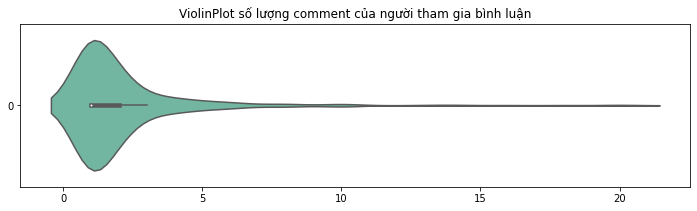

In [ ]:
#@title    

import matplotlib.pyplot as plt
import seaborn as sns
so_nguoi = data.groupby('user.name').count().reset_index()
print('Số bình luận = ',len(data),'. Số người tham gia bình luận = ', len(so_nguoi),'. Median comment / user = ', so_nguoi['originalContent'].median())
plt.figure(figsize = (12,3))
sns.violinplot(data=so_nguoi['originalContent'], orient="h", palette="Set2").set_title('ViolinPlot số lượng comment của người tham gia bình luận')

# **Visualize Sentiment Analysis**

Ý nghĩa của biểu đồ: Biểu diễn số lượng bình luận tích cực / tiêu cực / trung tính theo khung thời gian.
* Positive Comment: Bình luận được máy nhận diện là tích cực
* Negative Comment: Bình luận được máy nhận diện là tiêu cực
* Neutral Comment: Bình luận được máy nhận diện là không có trạng thái cảm xúc (hoặc máy không nhận diện được)

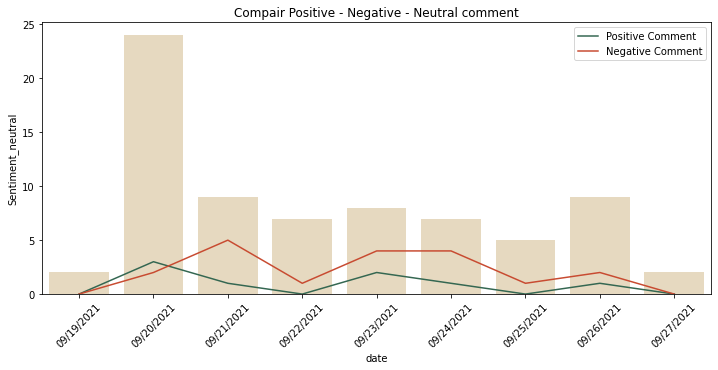

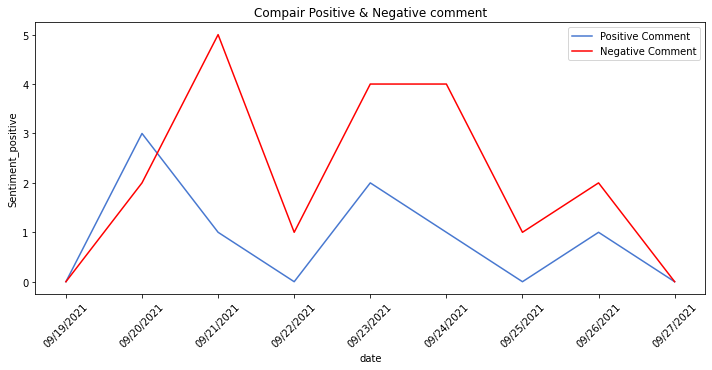

# **Visualize Topic Cluster**

Ý nghĩa biểu đồ: Phân loại comment theo 4 nhóm: Cơ bản / Kĩ thuật / Vĩ mô / Tin đồn. Và nhận diện cảm xúc (tích cực / tiêu cực) trên từng loại topic

Text(0.5, 1.0, 'Topic Tin đồn')

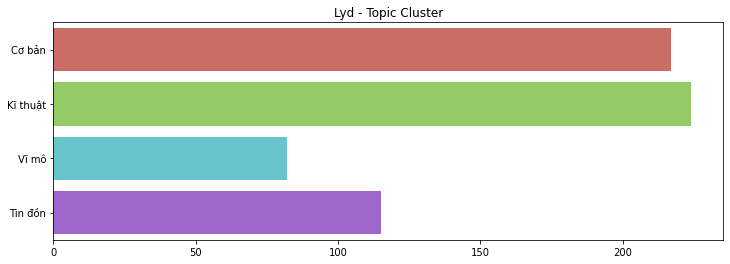

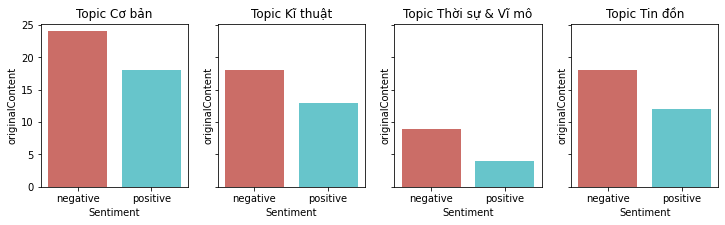

Số comment cơ bản =  217 . Số người tham gia comment =  129
Số comment kĩ thuật =  224 . Số người tham gia comment =  115
Số comment thời sự & vĩ mô =  82 . Số người tham gia comment =  61
Số comment tin đồn =  115 . Số người tham gia comment =  82


## **Text Summarization (tin đồn) using BERT**

In [ ]:
tin_don_show = tin_don.drop(['Content_Processed','Sentiment','Content_Tokenize'], axis = 1)
tin_don_show

,index,originalContent,date,user.name,Text_Summarize
0,0,"Chào buổi sáng anh chị. Tuần trước VNINDEX đã giữ điểm khá tốt khi kết phiên trên 1350 trước tin tức về Evergrande. Tuy vậy như em đã nhận định trên livestream, thị trường trong ngắn hạn vẫn tồn tại nhiều rủi ro. 1 số mã Penny đang có dấu hiệu phân phối sau thời gian tăng nóng vừa qua. Nhóm những mã cổ phiếu trụ tuy vẫn giúp giữ điểm nhưng tiền vào nhưng chưa mạnh mẽ. 1 số nhóm ngành tuy ra tin tốt liên tục nhưng giá vẫn giảm là do chúng đã phản ứng với tin tốt từ sớm và phản ánh hết vào giá, nhiều ngành thể hiện sự phân phối, ví dụ vận tải hoá chất dệt may. Theo em tháng 10 sắp tới sẽ có những đợt shake out cuối đến từ tạo lập để vét hàng, sau đó sẽ là 1-2 tuần để TT quay về cân bằng và tiếp tục uptrend do TT về vĩ mô vẫn sẽ có nhiều điều tích cực để kỳ vọng: dịch kiểm soát, doanh nghiệp quay lại sản xuất kinh doanh, chính phủ giải ngân đầu tư công,…\nTuần này khả năng cao em sẽ không mở mua mới và ưu tiên nắm giữ. Nếu xuất hiện giá ở nền hoặc hỗ trợ mạnh thì có thể cân nhắc mua gia tăng ạ. Chúc anh chị đầu tư thành công! Anh chị có thể tham gia room em hỗ trợ kỹ hơn",09/27/2021,Hoàng Nghĩa Tuấn Tú,"Chào buổi sáng anh chị. Tuy vậy như em đã nhận định trên livestream, thị trường trong ngắn hạn vẫn tồn tại nhiều rủi ro. Nhóm những mã cổ phiếu trụ tuy vẫn giúp giữ điểm nhưng tiền vào nhưng chưa mạnh mẽ."
1,1,"[Nhận định thị trường] \n\n💥 Vnindex: phiên cuối tuần vừa rồi tt mất gần 2 điểm nhưng vẫn giữ được hỗ trợ 1.350 điểm, thanh khoản giảm, tt vẫn xu hướng sideway. hỗ trợ mạnh 1320-1330.\n\n💥 Dòng cổ phiếu penny, midcaps tiếp tục bị bán mạnh và dòng tiền chuyển dịch trở lại vào nhóm Bluechips\n\nTrạng thái dòng cổ phiếu: \n👉 Dòng tiền quay trở lại nhóm ngân hàng, tuy nhiên dòng ngân hàng chạy không đồng đều, mức tăng k cao, chỉ có 1 vài cổ phiếu thanh khoản bùng nổ.\n+MSB: xu hướng mạnh hơn so vs nhóm ngành\n+TPB: hiện tại chưa có điểm mua mới\n+BVB: dấu hiệu phục hồi, dòng tiền thgia lại.\n👉Dòng chứng khoán: xu hướng chung đi ngang, tích lũy, triển vọng trong quý 3 và cuối năm vẫn tiềm năng, đang có thì tiếp tục nắm giữ : VND,VCI,VDS…\n\n👉Thép: tuần vừa rồi có dấu hiệu điều chỉnh: HSG,NKG đã có nhịp tăng khá dài,sau đó đã điều chỉnh. \n\n👉Dầu khí: giá dầu neo cao, kỳ vọng dầu khí sẽ bật lại trong tuần này. Các cổ phiếu theo dõi: PVS, BSR, PVD…\n\n\n📌 Hành động: \n+ Cần đưa tk về tỷ lệ tiền-ở mức an toàn.\n+ Tuần cuối cùng của quý3, các quỹ sẽ chốt NAV, ctck hạn chế margin để chốt q3 nên khả năng thanh khoản sẽ giảm trong tuần này\n+ Giải ngân khi tt trạng thái cân bằng, hạn chế mua đuổi.\nTrên đây là ý kiến cá nhân, không mang tinh chất khuyến nghị.\n\n==========\nHỗ trợ mở tkck online và tư vấn đầu tư:\nZalo/Phone: 0826468365\n\n",09/27/2021,Minh Thu,"[Nhận định thị trường] \n\n💥 Vnindex: phiên cuối tuần vừa rồi tt mất gần 2 điểm nhưng vẫn giữ được hỗ trợ 1.350 điểm, thanh khoản giảm, tt vẫn xu hướng sideway. 👉Dầu khí: giá dầu neo cao, kỳ vọng dầu khí sẽ bật lại trong tuần này. + Tuần cuối cùng của quý3, các quỹ sẽ chốt NAV, ctck hạn chế margin để chốt q3 nên khả năng thanh khoản sẽ giảm trong tuần này\n+ Giải ngân khi tt trạng thái cân bằng, hạn chế mua đuổi."
2,11,Những sự thật thú vị về TTCK mà nhà đầu tư mới có thể chưa biết\n1. Trừ thứ bảy và chủ nhật thì tất cả các ngày trong tuần đều là ngày T+3\n2. Không ai mong muống thị trường giảm hơn người đang cầm tiền và cũng chẳng ai mong thị trường lên hơn người cầm cổ.\nHai thế lực này sẽ chỉ thôi đối đầu nhau khi TTCK không còn tồn tại.\n3. Bạn cầm tiền không sai - Bạn cầm cổ cũng không sai.\nViệc sai là bạn không hiểu sao lại cầm tiền sao lại cầm cổ.\n4. Các cổ phiếu tăng trần mất thanh khoản thì sẽ giảm sàn cũng mất thang khoản. \n5. Nếu tự nhiên bạn bán sang khớp khả năng trúng đáy cao - Nếu tự nhiên mua trần khớp khả năng bị úp bô cao\n6. Doanh nghiệp tốt thì cổ phiếu sẽ tăng giá - Nhưng cổ phiếu tăng giá có thể chả kinh doanh gì.\n7. Phân tích kỹ thuật vẽ được thì Phân tích cơ bản cũng vẽ được.\nNếu cái gì đó th

# **Chi tiết 1000 comment gần nhất**

In [ ]:
data2 = data
data2 = data.drop(['Content_Processed','Sentiment','Content_Tokenize','topic_cluster'] , axis = 1)
data2

,originalContent,date,user.name
0,"Chào buổi sáng anh chị. Tuần trước VNINDEX đã giữ điểm khá tốt khi kết phiên trên 1350 trước tin tức về Evergrande. Tuy vậy như em đã nhận định trên livestream, thị trường trong ngắn hạn vẫn tồn tại nhiều rủi ro. 1 số mã Penny đang có dấu hiệu phân phối sau thời gian tăng nóng vừa qua. Nhóm những mã cổ phiếu trụ tuy vẫn giúp giữ điểm nhưng tiền vào nhưng chưa mạnh mẽ. 1 số nhóm ngành tuy ra tin tốt liên tục nhưng giá vẫn giảm là do chúng đã phản ứng với tin tốt từ sớm và phản ánh hết vào giá, nhiều ngành thể hiện sự phân phối, ví dụ vận tải hoá chất dệt may. Theo em tháng 10 sắp tới sẽ có những đợt shake out cuối đến từ tạo lập để vét hàng, sau đó sẽ là 1-2 tuần để TT quay về cân bằng và tiếp tục uptrend do TT về vĩ mô vẫn sẽ có nhiều điều tích cực để kỳ vọng: dịch kiểm soát, doanh nghiệp quay lại sản xuất kinh doanh, chính phủ giải ngân đầu tư công,…\nTuần này khả năng cao em sẽ không mở mua mới và ưu tiên nắm giữ. Nếu xuất hiện giá ở nền hoặc hỗ trợ mạnh thì có thể cân nhắc mua gia tăng ạ. Chúc anh chị đầu tư thành công! Anh chị có thể tham gia room em hỗ trợ kỹ hơn",09/27/2021,Hoàng Nghĩa Tuấn Tú
1,"[Nhận định thị trường] \n\n💥 Vnindex: phiên cuối tuần vừa rồi tt mất gần 2 điểm nhưng vẫn giữ được hỗ trợ 1.350 điểm, thanh khoản giảm, tt vẫn xu hướng sideway. hỗ trợ mạnh 1320-1330.\n\n💥 Dòng cổ phiếu penny, midcaps tiếp tục bị bán mạnh và dòng tiền chuyển dịch trở lại vào nhóm Bluechips\n\nTrạng thái dòng cổ phiếu: \n👉 Dòng tiền quay trở lại nhóm ngân hàng, tuy nhiên dòng ngân hàng chạy không đồng đều, mức tăng k cao, chỉ có 1 vài cổ phiếu thanh khoản bùng nổ.\n+MSB: xu hướng mạnh hơn so vs nhóm ngành\n+TPB: hiện tại chưa có điểm mua mới\n+BVB: dấu hiệu phục hồi, dòng tiền thgia lại.\n👉Dòng chứng khoán: xu hướng chung đi ngang, tích lũy, triển vọng trong quý 3 và cuối năm vẫn tiềm năng, đang có thì tiếp tục nắm giữ : VND,VCI,VDS…\n\n👉Thép: tuần vừa rồi có dấu hiệu điều chỉnh: HSG,NKG đã có nhịp tăng khá dài,sau đó đã điều chỉnh. \n\n👉Dầu khí: giá dầu neo cao, kỳ vọng dầu khí sẽ bật lại trong tuần này. Các cổ phiếu theo dõi: PVS, BSR, PVD…\n\n\n📌 Hành động: \n+ Cần đưa tk về tỷ lệ tiền-ở mức an toàn.\n+ Tuần cuối cùng của quý3, các quỹ sẽ chốt NAV, ctck hạn chế margin để chốt q3 nên khả năng thanh khoản sẽ giảm trong tuần này\n+ Giải ngân khi tt trạng thái cân bằng, hạn chế mua đuổi.\nTrên đây là ý kiến cá nhân, không mang tinh chất khuyến nghị.\n\n==========\nHỗ trợ mở tkck online và tư vấn đầu tư:\nZalo/Phone: 0826468365\n\n",09/27/2021,Minh Thu
2,"DỰ BÁO APH ĐẠT LỢI NHUẬN SAU THUẾ GẤP 2,4 LẦN SO VỚI 2020\nDự báo doanh thu năm 2021 của APH đạt 13.534 tỷ đồng - tăng 60% yoy trong đó mảng bất động sản tăng trở lại nhờ vào doanh thu từ diện tích còn lại của Complex và dự án Bất động sản An Phát 1 bắt đầu bán thương mại từ quý III - IV/2021.\nBên cạnh đó, sản lượng sản xuất bao bì nhựa tiếp tục tăng nhờ vào việc tăng xuất khẩu đến thị trường Mỹ và đóng góp từ bao Jumbo của Công ty Nhựa bao bì An Vinh.\nLợi nhuận sau thuế ước tính đạt 577 tỷ đồng - gấp 2,4 lần năm 2020.\n",09/26/2021,Sữa Ông Thọ
3,"Dòng bank đang hút tiền và manh nha có dấu hiệu trở lại dẫn dắt. Mình cũng đăng bank trong chuyên mục nhận định đầu tuần trước và ca ngợi vai trò dẫn dòng của TPB. Tuy nhiên, chắc đăng hơi sớm nên bị ae vào ""chửi"" đu đỉnh à, cao rồi còn đu,... và phải xoá bài cho đỡ ức :))\nGiờ tiền vào bank cũng rõ hơn, các cổ phiếu bank đang hút sự chú ý của nđt, mình nhận định một số mã bank khoẻ, mọi người xem cho vui (vui là chính, giao lưu là chủ yếu :)) )\nĐội CTG BID VCB nặng mông hơn. TCB MBB thì còn nhiều cản :)\n",09/26/2021,Enjoy Trading
4,Chuẩn bị cho một tuần mới của ngân hàng https://www.youtube.com/watch?v=UJppS7AH5pU&list=UUst5BGKXy1ZUZpOuw-jRroA&index=7🤑,09/26/2021,PG Stock
5,Nhóm nào sẽ dẫn sóng VNINDEX tuần tới?\n===>>>Ngân Hàng.\n\nhttps://www.youtube.com/watch?v=jnvRRKzwZHo,09/26/2021,kvcanh
6,"CẦM CHỪNG TRONG BIÊN ĐỘ HEP\n\nVnindex đóng cửa đỏ nhẹ vào T6 vừa rồi với thanh khoản thị trường tươn